In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from tensorflow.keras.preprocessing import image_dataset_from_directory
AUTOTUNE = tf.data.AUTOTUNE

In [ ]:
# Подключение Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Установка пути к датасету
dataset_path = "/content/drive/MyDrive/cats_and_dogs_filtered/cats_and_dogs_filtered"

# Параметры
IMG_SIZE = (128, 128)   # можно увеличить до (256, 256) если GPU тянет
BATCH_SIZE = 32

train_ds = image_dataset_from_directory(
    os.path.join(dataset_path, 'train'),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode=None,
)

val_ds = image_dataset_from_directory(
    os.path.join(dataset_path, 'validation'),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode=None,
)

full_ds = train_ds.concatenate(val_ds)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Found 2000 files.
Found 1000 files.


In [ ]:
def preprocess(image):
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1.0
    return image

full_ds = full_ds.map(preprocess, num_parallel_calls=AUTOTUNE)
full_ds = full_ds.shuffle(1000).prefetch(AUTOTUNE)

In [ ]:
EPOCHS = 200
noise_dim = 100
num_examples_to_generate = 16
seed = tf.random.normal([num_examples_to_generate, noise_dim])
generator_losses = []
discriminator_losses = []

In [ ]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(16 * 16 * 256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((16, 16, 256)))
    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same',
                                      use_bias=False, activation='tanh'))

    return model

In [ ]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Input(shape=(128, 128, 3)))

    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_labels = tf.ones_like(real_output) * 0.9  # label smoothing
    real_loss = cross_entropy(real_labels, real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator = make_generator_model()
discriminator = make_discriminator_model()

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [ ]:
def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    fig = plt.figure(figsize=(4, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i] * 127.5 + 127.5).numpy().astype("uint8"))
        plt.axis('off')

    plt.suptitle(f"Epoch {epoch}")
    plt.tight_layout()
    plt.savefig(f'generated_images/image_at_epoch_{epoch:03d}.png')
    plt.show()
    plt.close()


In [ ]:
#  Функция одного шага обучения
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return disc_loss, gen_loss

In [ ]:
def train(dataset, epochs):
    for epoch in range(epochs):
        # Переменные для потерь за эпоху
        epoch_gen_loss = 0
        epoch_disc_loss = 0

        for step, image_batch in enumerate(dataset):
            d_loss, g_loss = train_step(image_batch)
            epoch_gen_loss += g_loss
            epoch_disc_loss += d_loss

        # Добавляем средние потери
        generator_losses.append(epoch_gen_loss / len(dataset))
        discriminator_losses.append(epoch_disc_loss / len(dataset))

        # Показываем краткий лог:
        print(f"Epoch {epoch+1}/{epochs} | Loss D: {epoch_disc_loss / len(dataset):.4f}, Loss G: {epoch_gen_loss / len(dataset):.4f}")

        # Визуализируем только каждые 5 эпох
        if (epoch + 1) % 5 == 0 or epoch == 0:
            generate_and_save_images(generator, epoch + 1, seed)


Epoch 1/200 | Loss D: 0.5592, Loss G: 3.3145


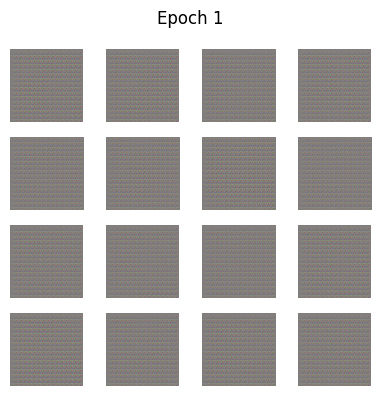

Epoch 2/200 | Loss D: 0.3755, Loss G: 5.4738
Epoch 3/200 | Loss D: 0.3553, Loss G: 8.1788
Epoch 4/200 | Loss D: 0.3626, Loss G: 7.2091
Epoch 5/200 | Loss D: 0.3922, Loss G: 5.7199


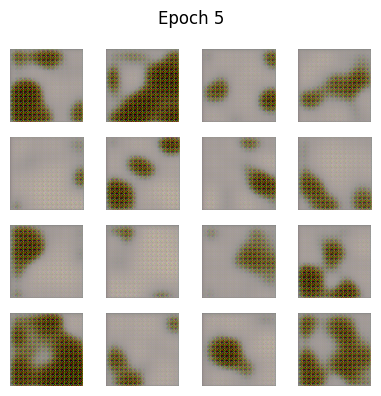

Epoch 6/200 | Loss D: 0.4008, Loss G: 5.8175
Epoch 7/200 | Loss D: 0.3659, Loss G: 5.3521
Epoch 8/200 | Loss D: 0.4270, Loss G: 5.3885
Epoch 9/200 | Loss D: 0.4902, Loss G: 4.5260
Epoch 10/200 | Loss D: 0.4355, Loss G: 5.3319


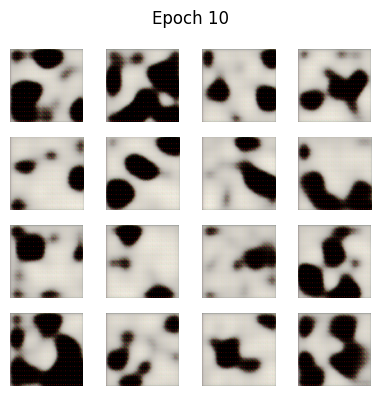

Epoch 11/200 | Loss D: 0.4054, Loss G: 5.6519
Epoch 12/200 | Loss D: 0.4294, Loss G: 4.3119
Epoch 13/200 | Loss D: 0.4666, Loss G: 4.2468
Epoch 14/200 | Loss D: 0.4229, Loss G: 3.9265
Epoch 15/200 | Loss D: 0.4109, Loss G: 4.6590


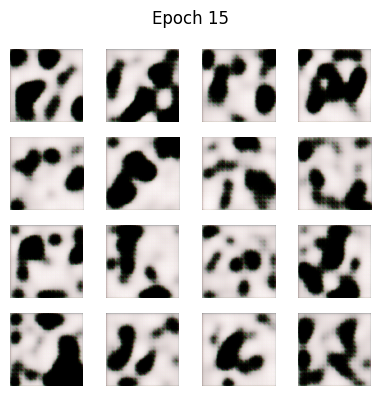

Epoch 16/200 | Loss D: 0.4132, Loss G: 4.2020
Epoch 17/200 | Loss D: 0.4462, Loss G: 4.7060
Epoch 18/200 | Loss D: 0.4373, Loss G: 4.0357
Epoch 19/200 | Loss D: 0.4511, Loss G: 4.2462
Epoch 20/200 | Loss D: 0.5149, Loss G: 4.3498


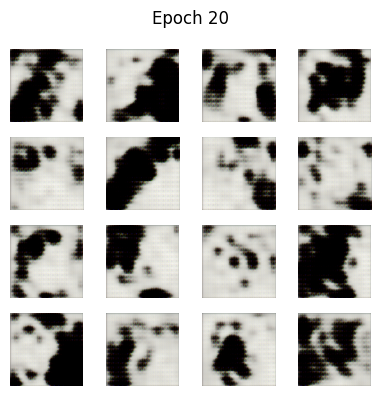

Epoch 21/200 | Loss D: 0.4472, Loss G: 4.2611
Epoch 22/200 | Loss D: 0.4485, Loss G: 4.0286
Epoch 23/200 | Loss D: 0.4594, Loss G: 4.0202
Epoch 24/200 | Loss D: 0.4994, Loss G: 4.0202
Epoch 25/200 | Loss D: 0.4333, Loss G: 4.0425


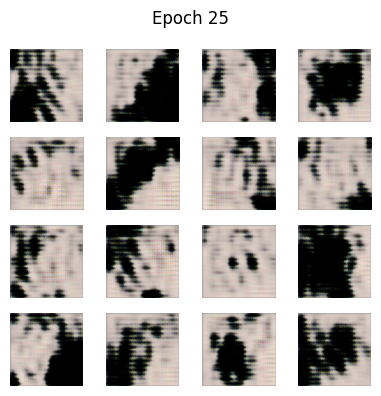

Epoch 26/200 | Loss D: 0.4459, Loss G: 3.9433
Epoch 27/200 | Loss D: 0.4767, Loss G: 3.9018
Epoch 28/200 | Loss D: 0.4541, Loss G: 3.6446
Epoch 29/200 | Loss D: 0.5261, Loss G: 4.2934
Epoch 30/200 | Loss D: 0.4045, Loss G: 4.2289


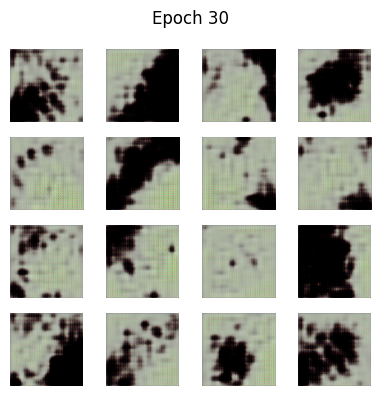

Epoch 31/200 | Loss D: 0.4510, Loss G: 4.0970
Epoch 32/200 | Loss D: 0.4507, Loss G: 3.7404
Epoch 33/200 | Loss D: 0.4570, Loss G: 4.1368
Epoch 34/200 | Loss D: 0.4289, Loss G: 4.4095
Epoch 35/200 | Loss D: 0.4352, Loss G: 4.2858


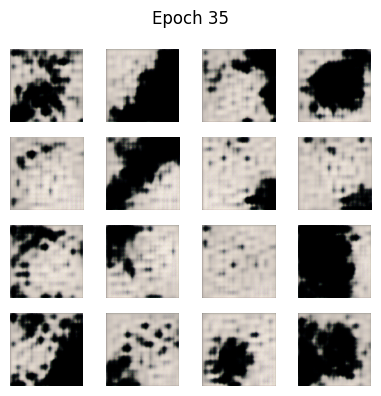

Epoch 36/200 | Loss D: 0.4278, Loss G: 4.3305
Epoch 37/200 | Loss D: 0.4341, Loss G: 4.1480
Epoch 38/200 | Loss D: 0.4130, Loss G: 4.0886
Epoch 39/200 | Loss D: 0.4363, Loss G: 4.0117
Epoch 40/200 | Loss D: 0.5236, Loss G: 4.3035


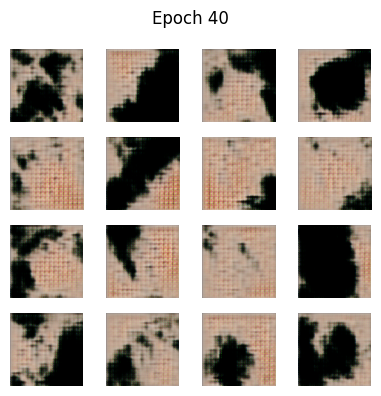

Epoch 41/200 | Loss D: 0.4179, Loss G: 4.5988
Epoch 42/200 | Loss D: 0.4542, Loss G: 4.9771
Epoch 43/200 | Loss D: 0.4535, Loss G: 4.0135
Epoch 44/200 | Loss D: 0.4988, Loss G: 3.8550
Epoch 45/200 | Loss D: 0.4924, Loss G: 3.6813


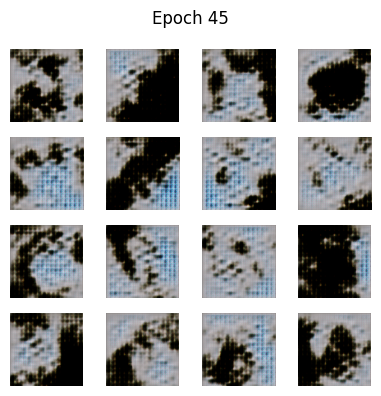

Epoch 46/200 | Loss D: 0.4277, Loss G: 4.0832
Epoch 47/200 | Loss D: 0.5048, Loss G: 3.6500
Epoch 48/200 | Loss D: 0.4497, Loss G: 4.4354
Epoch 49/200 | Loss D: 0.4277, Loss G: 3.9807
Epoch 50/200 | Loss D: 0.4825, Loss G: 3.7578


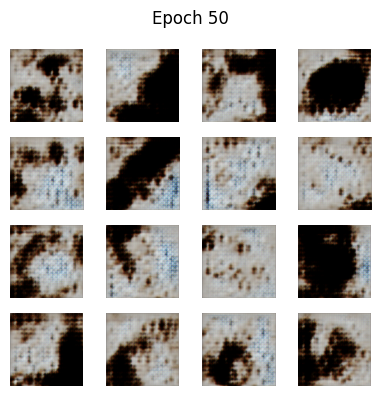

Epoch 51/200 | Loss D: 0.4731, Loss G: 4.0220
Epoch 52/200 | Loss D: 0.4797, Loss G: 3.8047
Epoch 53/200 | Loss D: 0.4534, Loss G: 4.0167
Epoch 54/200 | Loss D: 0.4349, Loss G: 4.2355
Epoch 55/200 | Loss D: 0.4630, Loss G: 3.7807


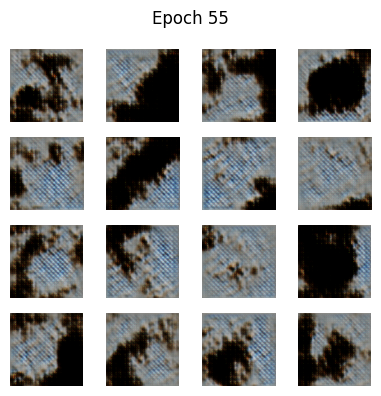

Epoch 56/200 | Loss D: 0.4646, Loss G: 3.8713
Epoch 57/200 | Loss D: 0.5157, Loss G: 4.0725
Epoch 58/200 | Loss D: 0.4483, Loss G: 3.8700
Epoch 59/200 | Loss D: 0.4270, Loss G: 4.1521
Epoch 60/200 | Loss D: 0.4491, Loss G: 4.3114


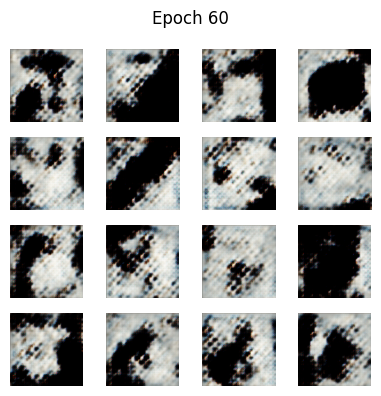

Epoch 61/200 | Loss D: 0.4647, Loss G: 4.4929
Epoch 62/200 | Loss D: 0.4276, Loss G: 4.3525
Epoch 63/200 | Loss D: 0.4054, Loss G: 4.0674
Epoch 64/200 | Loss D: 0.4125, Loss G: 4.1110
Epoch 65/200 | Loss D: 0.4426, Loss G: 3.9122


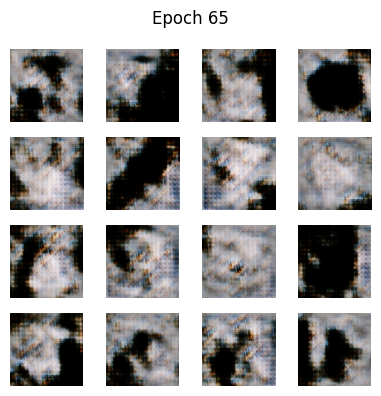

Epoch 66/200 | Loss D: 0.4941, Loss G: 3.7472
Epoch 67/200 | Loss D: 0.4930, Loss G: 4.2037
Epoch 68/200 | Loss D: 0.4604, Loss G: 3.9221
Epoch 69/200 | Loss D: 0.4412, Loss G: 4.6658
Epoch 70/200 | Loss D: 0.4914, Loss G: 4.1495


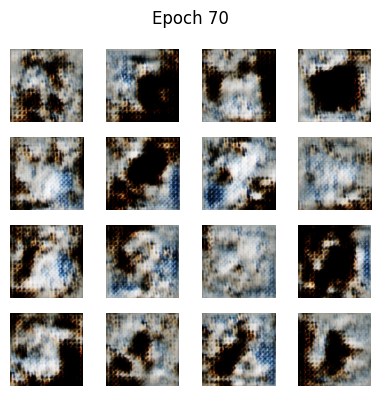

Epoch 71/200 | Loss D: 0.4609, Loss G: 3.7616
Epoch 72/200 | Loss D: 0.4663, Loss G: 3.9175
Epoch 73/200 | Loss D: 0.4503, Loss G: 3.7751
Epoch 74/200 | Loss D: 0.4576, Loss G: 3.9398
Epoch 75/200 | Loss D: 0.4868, Loss G: 4.0361


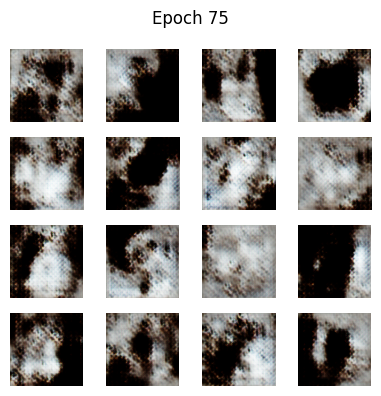

Epoch 76/200 | Loss D: 0.4490, Loss G: 4.5999
Epoch 77/200 | Loss D: 0.4727, Loss G: 3.9251
Epoch 78/200 | Loss D: 0.4601, Loss G: 3.8783
Epoch 79/200 | Loss D: 0.4464, Loss G: 4.1889
Epoch 80/200 | Loss D: 0.4297, Loss G: 4.1942


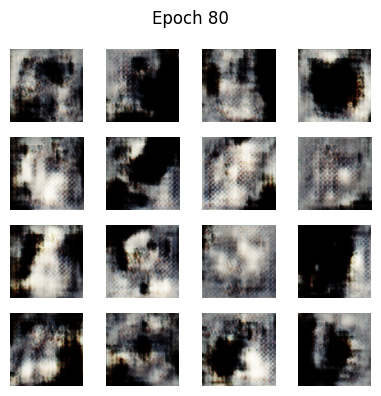

Epoch 81/200 | Loss D: 0.4761, Loss G: 4.0845
Epoch 82/200 | Loss D: 0.4489, Loss G: 4.1976
Epoch 83/200 | Loss D: 0.4650, Loss G: 4.1390
Epoch 84/200 | Loss D: 0.4400, Loss G: 4.1474
Epoch 85/200 | Loss D: 0.4558, Loss G: 4.1238


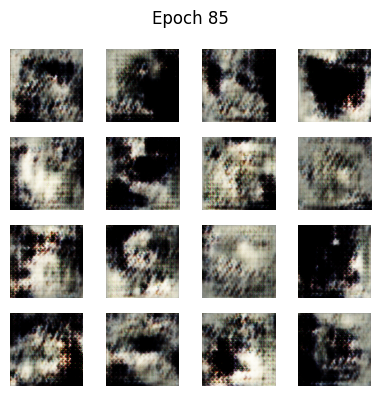

Epoch 86/200 | Loss D: 0.4522, Loss G: 4.9871
Epoch 87/200 | Loss D: 0.4188, Loss G: 4.1879
Epoch 88/200 | Loss D: 0.4275, Loss G: 4.3121
Epoch 89/200 | Loss D: 0.4643, Loss G: 4.3821
Epoch 90/200 | Loss D: 0.4236, Loss G: 4.2922


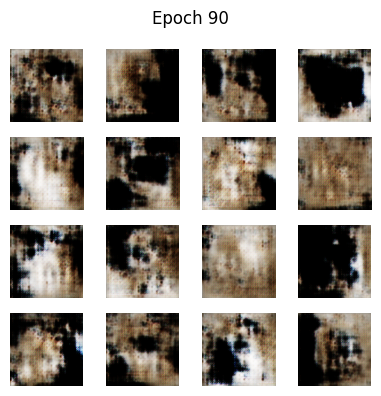

Epoch 91/200 | Loss D: 0.4506, Loss G: 4.0753
Epoch 92/200 | Loss D: 0.4829, Loss G: 4.2452
Epoch 93/200 | Loss D: 0.4348, Loss G: 4.1954
Epoch 94/200 | Loss D: 0.4641, Loss G: 4.5768
Epoch 95/200 | Loss D: 0.4297, Loss G: 4.5514


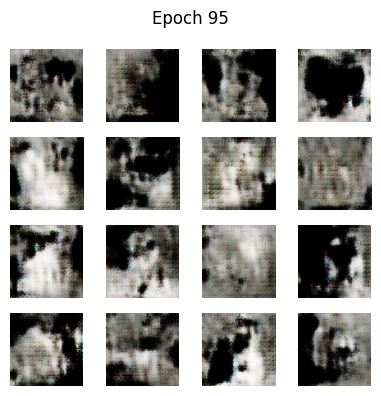

Epoch 96/200 | Loss D: 0.4632, Loss G: 4.2228
Epoch 97/200 | Loss D: 0.4520, Loss G: 4.5886
Epoch 98/200 | Loss D: 0.4238, Loss G: 4.2623
Epoch 99/200 | Loss D: 0.4430, Loss G: 4.1255
Epoch 100/200 | Loss D: 0.4552, Loss G: 4.2181


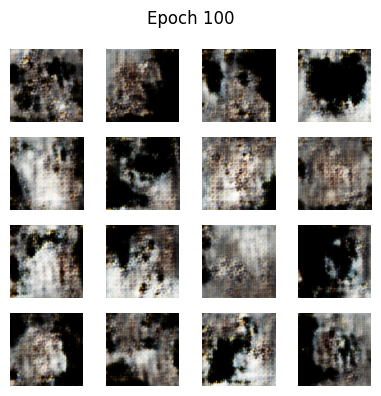

Epoch 101/200 | Loss D: 0.4554, Loss G: 4.1798
Epoch 102/200 | Loss D: 0.4361, Loss G: 4.6360
Epoch 103/200 | Loss D: 0.4389, Loss G: 4.4361
Epoch 104/200 | Loss D: 0.4795, Loss G: 4.3693
Epoch 105/200 | Loss D: 0.4454, Loss G: 4.5251


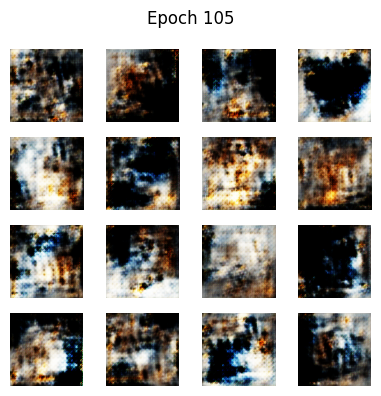

Epoch 106/200 | Loss D: 0.4810, Loss G: 4.6149
Epoch 107/200 | Loss D: 0.4502, Loss G: 4.3455
Epoch 108/200 | Loss D: 0.4777, Loss G: 4.0235
Epoch 109/200 | Loss D: 0.4509, Loss G: 4.3356
Epoch 110/200 | Loss D: 0.4553, Loss G: 4.2168


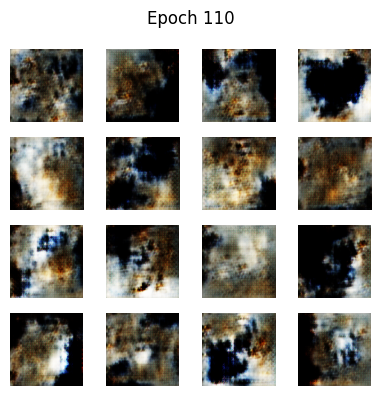

Epoch 111/200 | Loss D: 0.4852, Loss G: 4.3703
Epoch 112/200 | Loss D: 0.4356, Loss G: 4.0007
Epoch 113/200 | Loss D: 0.4651, Loss G: 4.3038
Epoch 114/200 | Loss D: 0.4647, Loss G: 4.2451
Epoch 115/200 | Loss D: 0.4713, Loss G: 3.9977


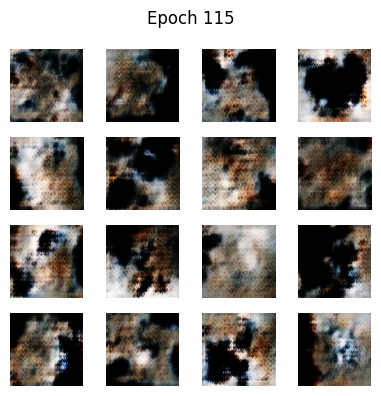

Epoch 116/200 | Loss D: 0.4770, Loss G: 4.1750
Epoch 117/200 | Loss D: 0.4510, Loss G: 4.4617
Epoch 118/200 | Loss D: 0.4683, Loss G: 4.2295
Epoch 119/200 | Loss D: 0.4436, Loss G: 4.4794
Epoch 120/200 | Loss D: 0.4664, Loss G: 4.3594


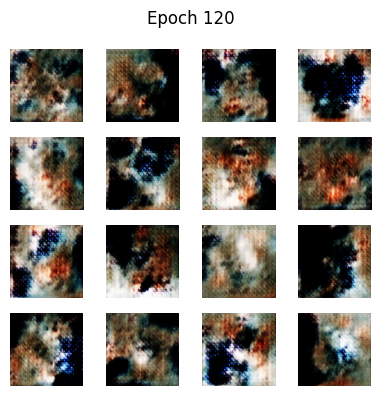

Epoch 121/200 | Loss D: 0.4545, Loss G: 4.1326
Epoch 122/200 | Loss D: 0.4625, Loss G: 4.3821
Epoch 123/200 | Loss D: 0.4521, Loss G: 4.3879
Epoch 124/200 | Loss D: 0.5160, Loss G: 4.3646
Epoch 125/200 | Loss D: 0.5089, Loss G: 4.1124


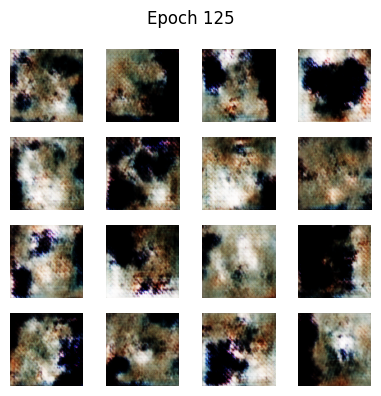

Epoch 126/200 | Loss D: 0.4943, Loss G: 4.3000
Epoch 127/200 | Loss D: 0.4419, Loss G: 4.0729
Epoch 128/200 | Loss D: 0.4926, Loss G: 4.1690
Epoch 129/200 | Loss D: 0.4621, Loss G: 4.4627
Epoch 130/200 | Loss D: 0.4666, Loss G: 4.7137


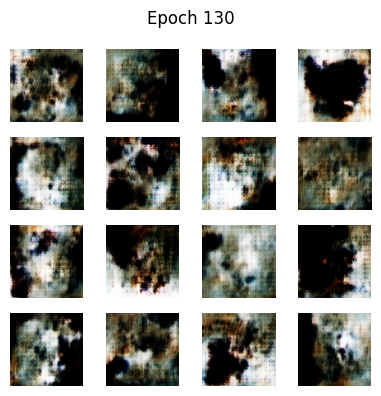

Epoch 131/200 | Loss D: 0.4566, Loss G: 4.2719
Epoch 132/200 | Loss D: 0.4566, Loss G: 4.1000
Epoch 133/200 | Loss D: 0.4767, Loss G: 4.1038
Epoch 134/200 | Loss D: 0.5060, Loss G: 4.0986
Epoch 135/200 | Loss D: 0.4700, Loss G: 4.0844


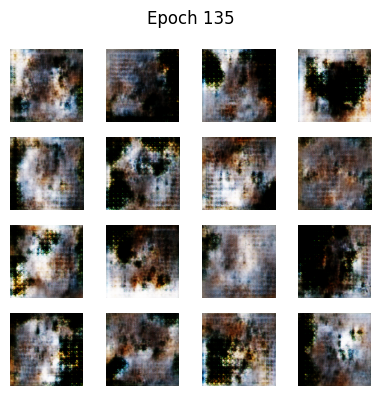

Epoch 136/200 | Loss D: 0.4868, Loss G: 4.4374
Epoch 137/200 | Loss D: 0.4857, Loss G: 4.1753
Epoch 138/200 | Loss D: 0.4652, Loss G: 4.1805
Epoch 139/200 | Loss D: 0.4861, Loss G: 4.0121
Epoch 140/200 | Loss D: 0.4551, Loss G: 4.1083


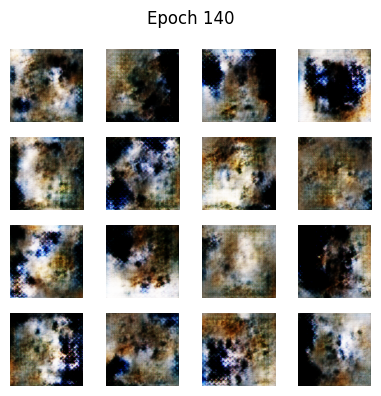

Epoch 141/200 | Loss D: 0.5005, Loss G: 4.0838
Epoch 142/200 | Loss D: 0.4591, Loss G: 4.2260
Epoch 143/200 | Loss D: 0.4944, Loss G: 4.6882
Epoch 144/200 | Loss D: 0.4886, Loss G: 4.1825
Epoch 145/200 | Loss D: 0.4920, Loss G: 3.9445


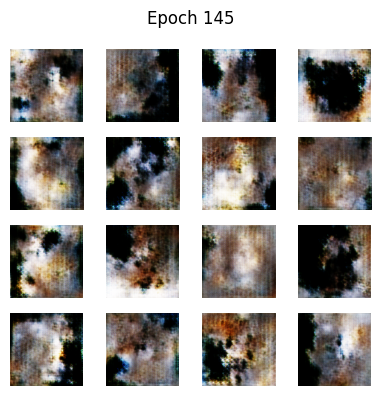

Epoch 146/200 | Loss D: 0.4942, Loss G: 4.3660
Epoch 147/200 | Loss D: 0.4759, Loss G: 4.2871
Epoch 148/200 | Loss D: 0.4814, Loss G: 4.0473
Epoch 149/200 | Loss D: 0.5062, Loss G: 4.1817
Epoch 150/200 | Loss D: 0.4852, Loss G: 3.9907


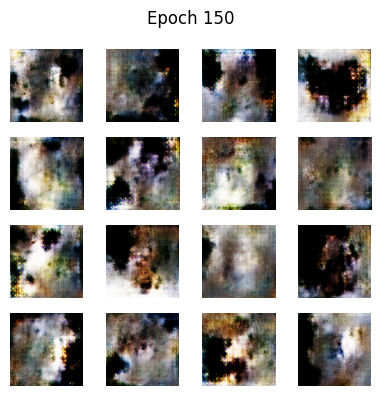

Epoch 151/200 | Loss D: 0.4908, Loss G: 4.1114
Epoch 152/200 | Loss D: 0.5087, Loss G: 4.3253
Epoch 153/200 | Loss D: 0.5026, Loss G: 3.9691
Epoch 154/200 | Loss D: 0.5142, Loss G: 4.6796
Epoch 155/200 | Loss D: 0.4681, Loss G: 3.8213


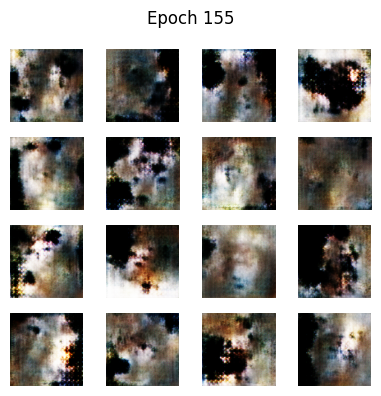

Epoch 156/200 | Loss D: 0.5201, Loss G: 4.1519
Epoch 157/200 | Loss D: 0.5261, Loss G: 3.9695
Epoch 158/200 | Loss D: 0.4906, Loss G: 4.0102
Epoch 159/200 | Loss D: 0.4747, Loss G: 4.6412
Epoch 160/200 | Loss D: 0.5352, Loss G: 4.8930


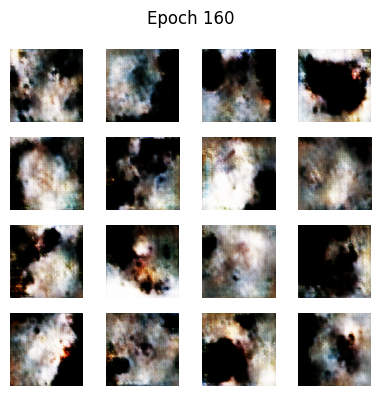

Epoch 161/200 | Loss D: 0.4730, Loss G: 4.0649
Epoch 162/200 | Loss D: 0.4901, Loss G: 4.1087
Epoch 163/200 | Loss D: 0.4645, Loss G: 4.0986
Epoch 164/200 | Loss D: 0.5190, Loss G: 4.0422
Epoch 165/200 | Loss D: 0.4949, Loss G: 3.8009


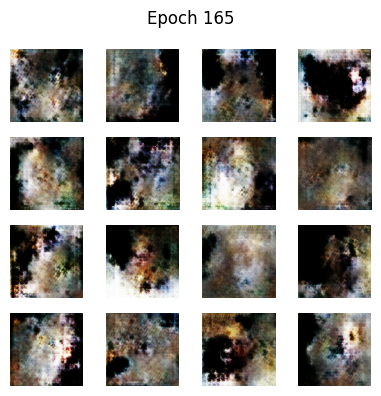

Epoch 166/200 | Loss D: 0.4704, Loss G: 4.1719
Epoch 167/200 | Loss D: 0.5062, Loss G: 4.2548
Epoch 168/200 | Loss D: 0.4665, Loss G: 4.3119
Epoch 169/200 | Loss D: 0.4881, Loss G: 4.0150
Epoch 170/200 | Loss D: 0.4658, Loss G: 4.3472


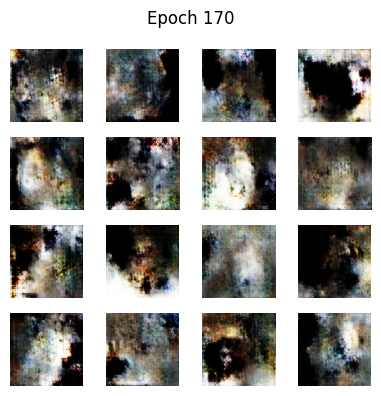

Epoch 171/200 | Loss D: 0.4863, Loss G: 4.0891
Epoch 172/200 | Loss D: 0.4749, Loss G: 4.2605
Epoch 173/200 | Loss D: 0.4866, Loss G: 4.2615
Epoch 174/200 | Loss D: 0.4879, Loss G: 4.0937
Epoch 175/200 | Loss D: 0.4805, Loss G: 3.9202


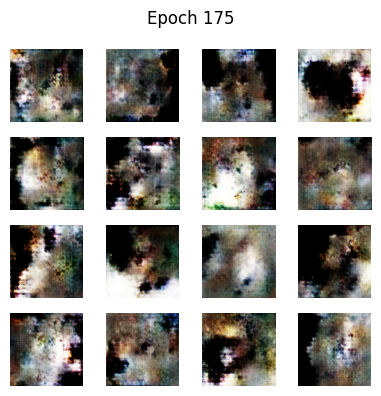

Epoch 176/200 | Loss D: 0.4614, Loss G: 4.2299
Epoch 177/200 | Loss D: 0.5131, Loss G: 4.0700
Epoch 178/200 | Loss D: 0.4803, Loss G: 4.2573
Epoch 179/200 | Loss D: 0.4816, Loss G: 4.3328
Epoch 180/200 | Loss D: 0.4918, Loss G: 4.2919


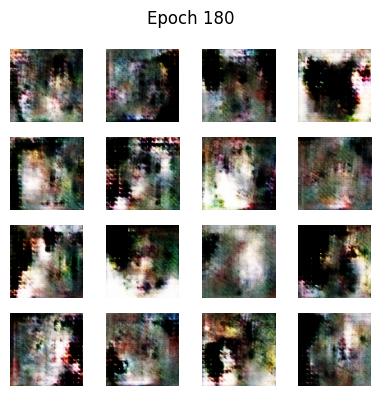

Epoch 181/200 | Loss D: 0.4783, Loss G: 4.2745
Epoch 182/200 | Loss D: 0.4891, Loss G: 4.0158
Epoch 183/200 | Loss D: 0.4840, Loss G: 4.4223
Epoch 184/200 | Loss D: 0.4641, Loss G: 4.2787
Epoch 185/200 | Loss D: 0.4694, Loss G: 4.2637


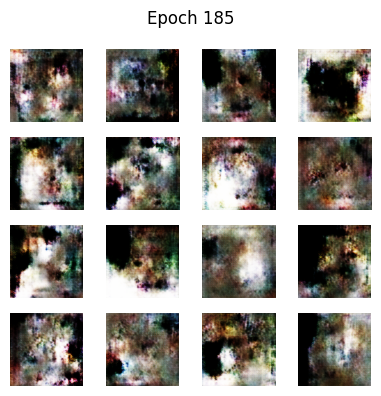

Epoch 186/200 | Loss D: 0.4805, Loss G: 4.2081
Epoch 187/200 | Loss D: 0.5019, Loss G: 4.3303
Epoch 188/200 | Loss D: 0.4798, Loss G: 4.3110
Epoch 189/200 | Loss D: 0.5175, Loss G: 3.8249
Epoch 190/200 | Loss D: 0.5128, Loss G: 4.0363


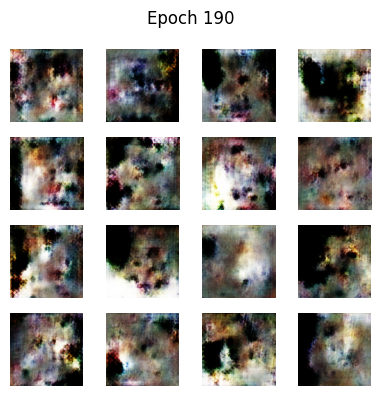

Epoch 191/200 | Loss D: 0.4887, Loss G: 4.2267
Epoch 192/200 | Loss D: 0.4906, Loss G: 3.9042
Epoch 193/200 | Loss D: 0.4984, Loss G: 4.0213
Epoch 194/200 | Loss D: 0.5049, Loss G: 4.5140
Epoch 195/200 | Loss D: 0.4810, Loss G: 4.8204


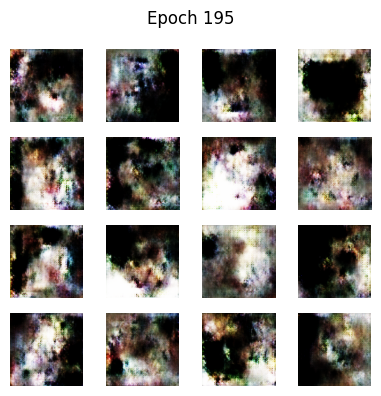

Epoch 196/200 | Loss D: 0.5176, Loss G: 5.0983
Epoch 197/200 | Loss D: 0.4463, Loss G: 4.2742
Epoch 198/200 | Loss D: 0.4900, Loss G: 4.5125
Epoch 199/200 | Loss D: 0.4368, Loss G: 4.2758
Epoch 200/200 | Loss D: 0.4752, Loss G: 4.1956


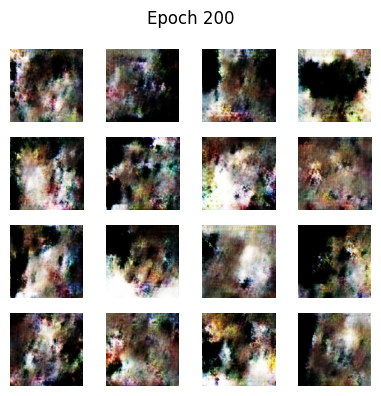

In [ ]:
train(full_ds, EPOCHS)

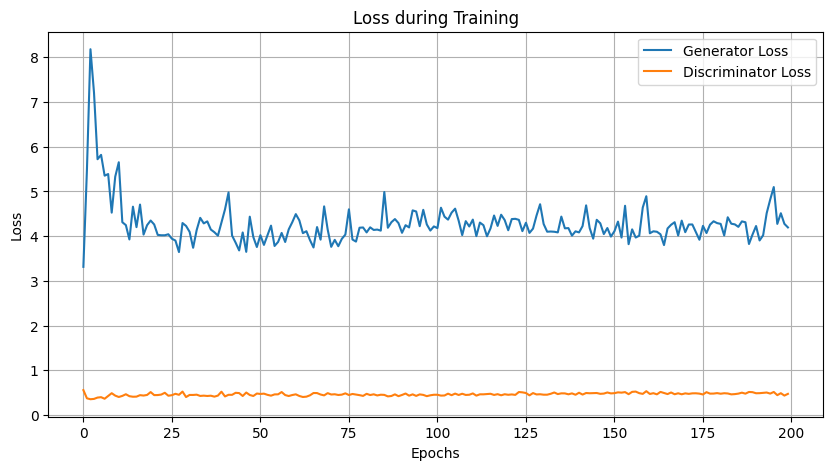

In [ ]:
# График потерь (общий для всей тренировки)
plt.figure(figsize=(10, 5))
plt.plot(generator_losses, label='Generator Loss')
plt.plot(discriminator_losses, label='Discriminator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss during Training')
plt.grid(True)
plt.show()